# PCA->k-means Image Classifier: Step 5

In [1]:
#%load_ext autotime
#%load_ext autoreload
#%autoreload 2

import joblib

from cls import *

from scipy import signal

Welcome to eht-imaging! v 1.2.4 



## Load images and clustering

In [2]:
imgs = joblib.load('imgs.joblib')
kmap = joblib.load('kmap.joblib')

In [9]:
#Reminder: k is 0, a is 1, d is 2, s is 3, o is 4
#Input the two algorithms you wish to specifically compare
alg1 = 0
alg2 = 4

## Finding and visualizing mean images

In [4]:
nmethods = np.size(kmap, 0)  #number of algorithms, for the deviation comparison
nclus = np.max(kmap) + 1  #the number of clusters for both algorithms

Text(2580, -50, '32')

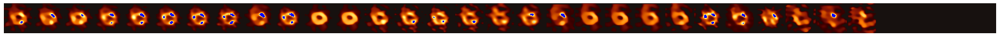

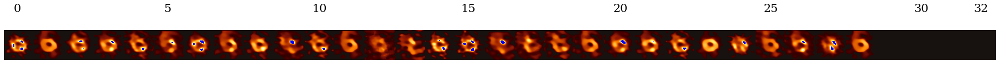

In [5]:
avgimgara_allmethods = np.zeros((nmethods, int(nclus), 80, 80))
imglist = list(imgs.items())

for m in range(nmethods):  #m is an method index
    avgimgara = np.zeros((int(nclus), 80, 80))

    for k in range(int(nclus)):  #k is a cluster index
        sumara = np.zeros((80,80))
        counter = 0
        for i in range(len(imglist)):   #each i indexes a single image in imglist
            if kmap[m,i] == k:
                sumara += np.array(imglist[i][1])
                counter += 1
        avgimg = sumara/counter
        avgimgara[k] = avgimg
        
    avgimgara_allmethods[m] = avgimgara
    
plot_grid(avgimgara_allmethods[alg1], ncol = 33)
plot_grid(avgimgara_allmethods[alg2], ncol = 33)
plt.text(x=25, y=-50, s=0, fontsize='xx-large')
plt.text(x=425, y=-50, s=5, fontsize='xx-large')
plt.text(x=820, y=-50, s=10, fontsize='xx-large')
plt.text(x=1215, y=-50, s=15, fontsize='xx-large')
plt.text(x=1620, y=-50, s=20, fontsize='xx-large')
plt.text(x=2020, y=-50, s=25, fontsize='xx-large')
plt.text(x=2420, y=-50, s=30, fontsize='xx-large')
plt.text(x=2580, y=-50, s=32, fontsize='xx-large')

## Comparing images to means between different algorithms

In [6]:
print('Lower scores indicate lower deviation between images and their mean image (indicative of better clustering)')
print('so after normalization, 1 is the worst score. This score does not account for outliers however, so algorithms')
print('that cluster fewer total images and have more outliers will artificially have lower scores.')
print(' k     a     d     s     o')

sumdiff_allmethods = np.array([])

for m in range(nmethods):

    sumdiff = 0.

    for k in range(int(np.max(kmap))):
        for i in range(len(imglist)):
            if kmap[m,i] == k:
                diffara = np.abs(imglist[i][1] - avgimgara_allmethods[m][k])
                sumdiff += np.sum(diffara)

    sumdiff_allmethods = np.append(sumdiff_allmethods, sumdiff)

print(np.array_str(sumdiff_allmethods/np.max(sumdiff_allmethods), precision = 3), '(score)')
imgcountara = np.zeros(5, int)
for a in range(5):
    for k in kmap[a]:
        if k == -1:
            imgcountara[a] += -1
imgcountara += len(kmap[0])
imgcountarafloats = np.asarray(imgcountara, float)
print(np.array_str(imgcountarafloats, precision = 3), '(how many images were clustered, non-outliers)')

Lower scores indicate lower deviation between images and their mean image (indicative of better clustering)
so after normalization, 1 is the worst score. This score does not account for outliers however, so algorithms
that cluster fewer total images and have more outliers will artificially have lower scores.
 k     a     d     s     o
[1.    0.    0.    0.    0.101] (score)
[4045.    0.    0.    0.  904.] (how many images were clustered, non-outliers)


## Visualize clustering

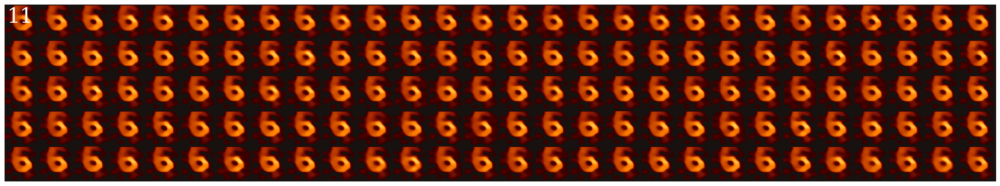

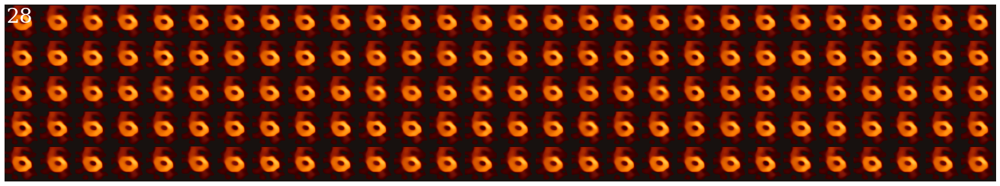

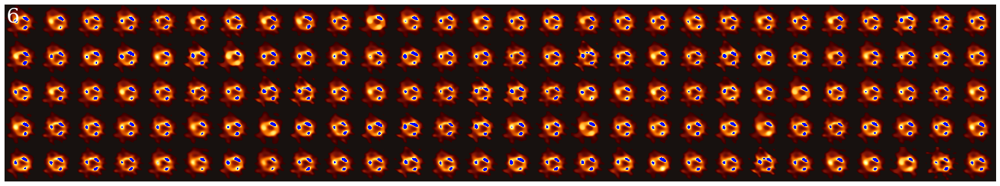

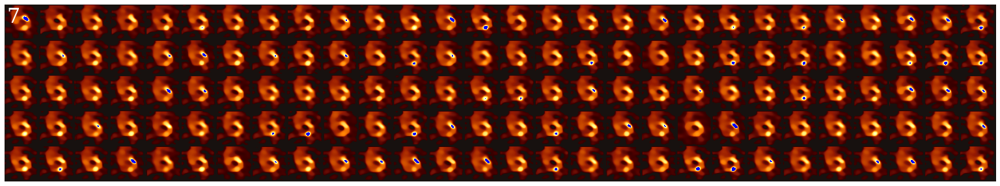

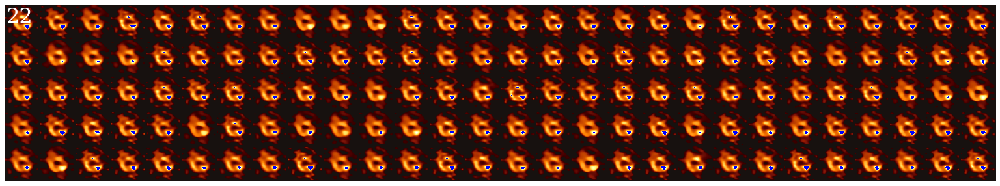

...

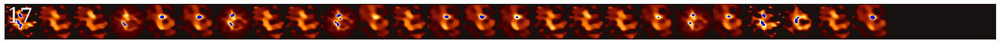

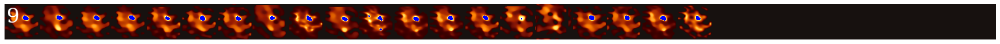

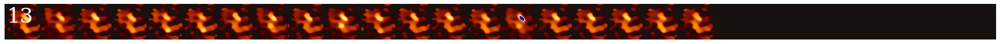

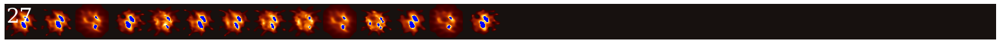

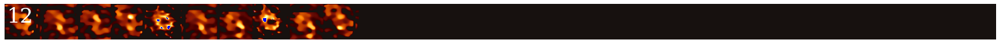

In [10]:
#This is visualizing alg1 from above

kc   = dict(zip(*np.unique(kmap[alg1], return_counts=True)))
keys = list({k: v for k, v in sorted(kc.items(), key=lambda v: v[1], reverse=True)}.keys())

means     = []
variances = []
ivals = list(imgs.values())

for k in keys:
    imgs_k = [ivals[w] for w in np.where(kmap[alg1] == k)[0]]
    means     += [np.mean(imgs_k, axis=0)]
    variances += [np.var(imgs_k,  axis=0)]

    if len(imgs_k) > 140:
        np.random.shuffle(imgs_k)
        imgs_k = imgs_k[:140]
        
    plot_grid(imgs_k, ncol=28)
    plt.annotate(k, xy=(4,40), fontsize=32, color='w')

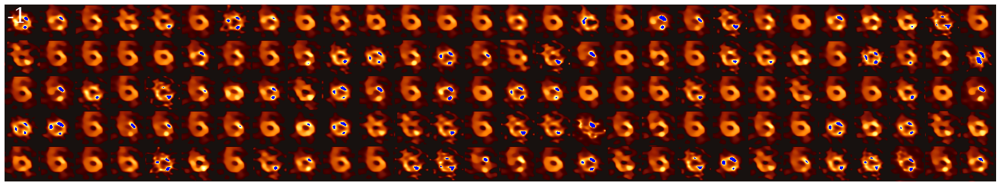

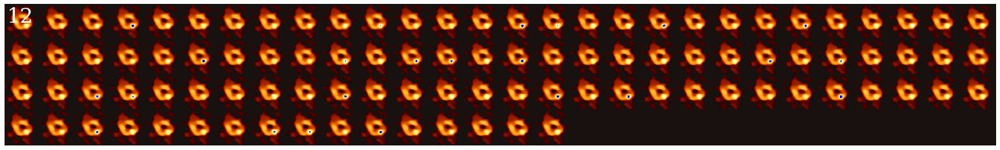

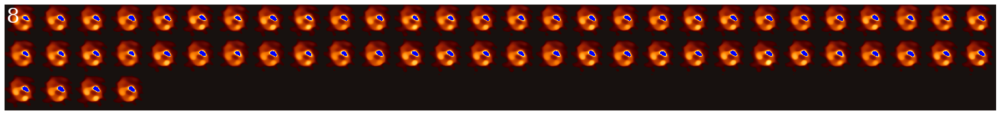

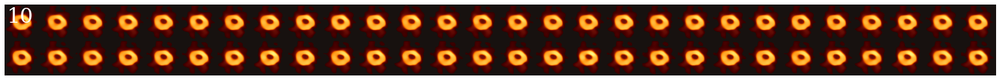

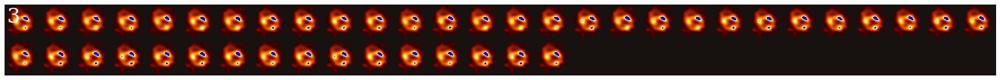

...

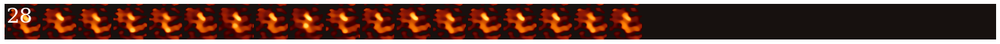

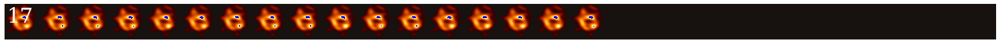

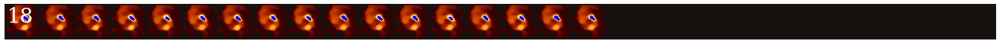

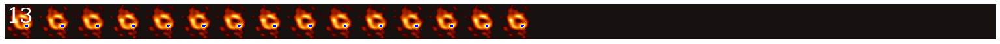

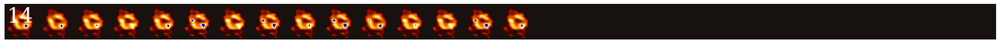

In [11]:
#This is visualizing alg2 from above

kc   = dict(zip(*np.unique(kmap[alg2], return_counts=True)))
keys = list({k: v for k, v in sorted(kc.items(), key=lambda v: v[1], reverse=True)}.keys())

means     = []
variances = []
ivals = list(imgs.values())

for k in keys:
    imgs_k = [ivals[w] for w in np.where(kmap[alg2] == k)[0]]
    means     += [np.mean(imgs_k, axis=0)]
    variances += [np.var(imgs_k,  axis=0)]

    if len(imgs_k) > 140:
        np.random.shuffle(imgs_k)
        imgs_k = imgs_k[:140]
        
    plot_grid(imgs_k, ncol=28)
    plt.annotate(k, xy=(4,40), fontsize=32, color='w')


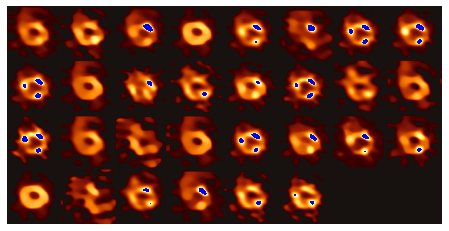

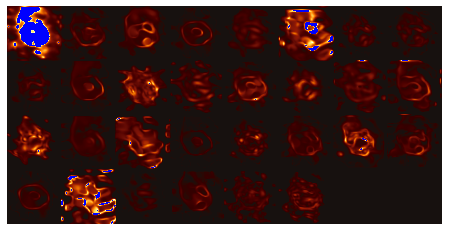

In [12]:
plot_grid(means, ncol=8)
plot_grid(variances, ncol=8, vmax=0.01)

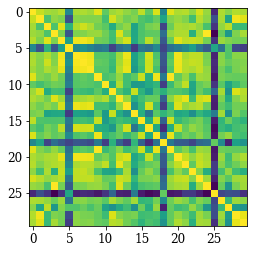

In [13]:
nxcorrs = np.array([[nxcorr(img1, img2) for img2 in means] for img1 in means])
plt.imshow(nxcorrs)

In [ ]:
'''
#Merging clusters together should you wish to reduce the sizes

n_final = 24

kmap_merge = kmap
keys_merge = np.unique(kmap_merge)
for i in range(32-n_final):
    means     = []
    variances = []
    for k in keys_merge:
        imgs_k = [ivals[w] for w in np.where(kmap_merge == k)[0]]
        means     += [np.mean(imgs_k, axis=0)]
        variances += [np.var(imgs_k,  axis=0)]
        
    nxcorrs = np.array([[nxcorr(img1, img2) for img2 in means] for img1 in means])
    triu = np.triu(nxcorrs - np.eye(nxcorrs.shape[0]))
    plt.imshow(triu)
    
    ia, ib = np.unravel_index(triu.argmax(), triu.shape)
    a = keys_merge[ia]
    b = keys_merge[ib]
    print(f'merge: a[{ia}] = {a} and b[{ib}] = {b}')
    kmap_merge[kmap_merge == b] = a
    keys_merge = np.unique(kmap_merge)

    print(keys_merge)
'''

In [ ]:
'''
means     = []
variances = []
for k in np.unique(kmap_merge):
    imgs_k = [ivals[w] for w in np.where(kmap_merge == k)[0]]
    means     += [np.mean(imgs_k, axis=0)]
    variances += [np.var(imgs_k,  axis=0)]

    if len(imgs_k) > 128:
        np.random.shuffle(imgs_k)
        imgs_k = imgs_k[:128]
        
    plot_grid(imgs_k, ncol=32)
    plt.annotate(k, xy=(4,36), fontsize=32, color='w')
'''

## Which clusters between the algorithms match each other?

 | 0 => k, 1 => a, 2 => d, 3 => s, 4 => o
 V


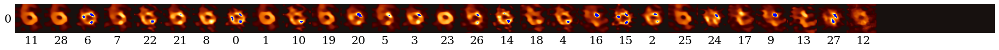

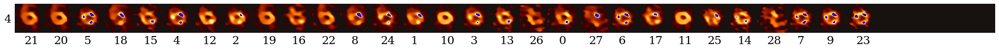

In [14]:
nclus = int(np.max(kmap)) + 1  #number of clusters for both algorithms chosen above

alg1cluslist = np.zeros(nclus, int)          #This array is created in such a way to ensure that
imgperclustercounter = np.zeros(nclus, int)  #the most populated clusters from alg1 are given priority
for i in range(nclus):                       #in finding matching clusters from alg2.
    counter = 0
    for k in kmap[alg1]:
        if int(k) == i:
            counter += 1
    imgperclustercounter[i] = counter
for i in range(nclus):
    val = 0
    for l in range(nclus):
        if imgperclustercounter[l] > val:
            relevantl = l
            val = imgperclustercounter[l]
    alg1cluslist[i] = relevantl
    imgperclustercounter[relevantl] = -1

clustermatches = np.zeros((nclus, 2), int)

clustermatchesindex = 0
for m in alg1cluslist:       #m is cluster index for alg1
    testsum = 10000.         #initializing large sum and shrinking from there
    for n in range(nclus):   #n is cluster index for alg2
        if np.sum(abs(avgimgara_allmethods[alg1][m] - avgimgara_allmethods[alg2][n])) < testsum:
            testsum = np.sum(abs(avgimgara_allmethods[alg1][m] - avgimgara_allmethods[alg2][n]))
            relevantn = n
    clustermatches[clustermatchesindex] = np.array([m, relevantn])
    clustermatchesindex += 1
    avgimgara_allmethods[alg2][relevantn] += -1  #making sure this mean image is not detected again by making it dissimilar
avgimgara_allmethods[alg2] += 1                  #to the other images, and then fixing them once the loop is over
        
newimgara1 = np.zeros((nclus, 80, 80))
newimgara2 = np.zeros((nclus, 80, 80))
for i in range(nclus):
    newimgara1[i] = avgimgara_allmethods[alg1][int(clustermatches[i][0])]
    newimgara2[i] = avgimgara_allmethods[alg2][int(clustermatches[i][1])]

plot_grid(newimgara1, ncol = 33)
clustermatchestrans = np.transpose(clustermatches)
xt = 25
yt = 110
for i1 in clustermatchestrans[0]:
    plt.text(x = xt, y = yt, s = i1, fontsize = 'xx-large')
    xt += 80
plt.text(x = -30, y = 50, s = alg1, fontsize = 'xx-large')

plot_grid(newimgara2, ncol = 33)
xt = 25  #reseting the x position
for i2 in clustermatchestrans[1]:
    plt.text(x = xt, y = yt, s = i2, fontsize = 'xx-large')
    xt += 80
plt.text(x = -30, y = 50, s = alg2, fontsize = 'xx-large')

print(' | 0 => k, 1 => a, 2 => d, 3 => s, 4 => o')
print(' V')

## How much do the clusters match

In [15]:
imglisttrans = np.transpose(imglist)

for k in range(len(clustermatchestrans[0])):
    counter = 0
    for imgindex in range(len(imglisttrans[1])):
        if kmap[alg1][imgindex] == clustermatchestrans[0][k] and kmap[alg2][imgindex] == clustermatchestrans[1][k]:
            counter += 1
    print(f'Clusters {clustermatchestrans[0][k]} of alg1 and {clustermatchestrans[1][k]} of alg2 have {counter} images in common')


Clusters 11 of alg1 and 21 of alg2 have 14 images in common
Clusters 28 of alg1 and 20 of alg2 have 23 images in common
Clusters 6 of alg1 and 5 of alg2 have 37 images in common
Clusters 7 of alg1 and 18 of alg2 have 0 images in common
Clusters 22 of alg1 and 15 of alg2 have 29 images in common
Clusters 21 of alg1 and 4 of alg2 have 0 images in common
Clusters 8 of alg1 and 12 of alg2 have 100 images in common
Clusters 0 of alg1 and 2 of alg2 have 0 images in common
Clusters 1 of alg1 and 19 of alg2 have 19 images in common
Clusters 10 of alg1 and 16 of alg2 have 28 images in common
Clusters 19 of alg1 and 22 of alg2 have 28 images in common
Clusters 20 of alg1 and 8 of alg2 have 60 images in common
Clusters 5 of alg1 and 24 of alg2 have 0 images in common
Clusters 3 of alg1 and 1 of alg2 have 20 images in common
Clusters 23 of alg1 and 10 of alg2 have 56 images in common
Clusters 26 of alg1 and 3 of alg2 have 0 images in common
Clusters 14 of alg1 and 13 of alg2 have 0 images in commo

In [17]:
#Sanity check for matching image numbers, try varying testk's to see if the numbers of matches above make sense.

testk = 1

count = 0
for k in kmap[alg1]:
    if k == clustermatchestrans[0][testk]:
        count += 1
print(f'{count} images in cluster {clustermatchestrans[0][testk]} of alg1')

count = 0
for k in kmap[alg2]:
    if k == clustermatchestrans[1][testk]:
        count += 1
print(f'{count} images in cluster {clustermatchestrans[1][testk]} of alg2')

349 images in cluster 28 of alg1
23 images in cluster 20 of alg2
